In [1]:
import os
os.chdir("../")

overwrite = False
dataset_name = 'nicu'
attr_suffix = '_at'
suffix = '_self' 

# Data

In [2]:
with open('run/settings.py', 'r') as file:
    exec(file.read())
with open('run/data.py', 'r') as file:
    exec(file.read())

Random seed set to 333
using device:  cpu
nicu_at_self

Sample of patients with positive labels:
VitalID
1018    8
5170    8
1835    8
2361    8
2791    8
dtype: int64


Processing descriptions: 100%|██████████| 131/131 [00:27<00:00,  4.85it/s]


After downsampling:
description_histogram
Low variability.     20000
High variability.    16679
Name: count, dtype: int64
train, test, left:  25675 7336 3668


final distribution of text prediction
description_histogram
Low variability.     14000
High variability.    11675
Name: count, dtype: int64
description_histogram
Low variability.     4000
High variability.    3336
Name: count, dtype: int64
description_histogram
Low variability.     2000
High variability.    1668
Name: count, dtype: int64
text
Low variability. No events.                       13562
High variability. No events.                      10622
High variability. Bradycardia events happened.     1053
Low variability. Bradycardia events happened.       438
Name: count, dtype: int64
text
Low variability. No events.                       3882
High variability. No events.                      3017
High variability. Bradycardia events happened.     319
Low variability. Bradycardia events happened.      118
Name: count, dtype: 

In [3]:
# import matplotlib.pyplot as plt

# # Make sure original data is preserved before smoothing
# original_data = df_train.loc[:, '1':'300'].copy().astype(float)

# # Plot comparison for first 5 samples
# num_samples = 5
# fig, axes = plt.subplots(num_samples, 1, figsize=(12, 3 * num_samples), sharex=True)

# for i in range(num_samples):
#     axes[i].plot(original_data.columns.astype(int), original_data.iloc[i], label='Original', alpha=0.6)
#     axes[i].set_title(f"Sample {i}")
#     axes[i].legend()
#     axes[i].set_ylabel("HR")

# axes[-1].set_xlabel("Time Step")
# plt.tight_layout()
# plt.show()


# Model (customizable)

In [4]:
# config_dict['alpha_init'] = 10 # close to okay at 0.6
with open('run/model.py', 'r') as file:
    exec(file.read())

nicu_at_self
/Users/joyqiu/Documents/Documents JoyQiu Work/Research/LLMTimeSeries/llm_nicu_vitalsigns/script/VITAL/results/nicu_at_self
nicu_at_self
Layer (type:depth-idx)                                                 Param #
VITAL                                                                  --
├─TSEncoder: 1-1                                                       --
│    └─LocalNorm: 2-1                                                  --
│    └─PatchCNNTSEncoder: 2-2                                          --
│    │    └─ModuleList: 3-1                                            1,859,424
│    │    └─LayerNorm: 3-2                                             1,536
├─TextEncoder: 1-2                                                     --
│    └─PatchMLPTextEncoder: 2-3                                        --
│    │    └─ModuleList: 3-3                                            5,327,616
├─TSDecoder: 1-3                                                       --
│    └─SelfAttn

In [5]:
# config_dict['alpha_init'] = 5e-2
# with open('run/train_2steps.py', 'r') as file:
#     exec(file.read())

# Generation

In [6]:
# tid=1
# viz_generation_conditional(df_left, model, config_dict, tid=tid, sampling=True, b=1, ep=1)

In [7]:
# tid=0
# # viz_generation_marginal(df_train, model, config_dict, tid=tid)
# viz_generation_conditional(df_train, model, config_dict, tid=tid, sampling=True, b=1, ep=1)

In [1]:
import os, re
import pandas as pd
os.chdir("../../") # set to llm_nicu_vitalsigns/script/
os.getcwd()

'/Users/joyqiu/Documents/Documents JoyQiu Work/Research/LLMTimeSeries/llm_nicu_vitalsigns/script'

In [25]:
import os
import pandas as pd
import re

attr_suffix = '_at'
w = 0.9
single_score = True

res_df_all = []
dataset_names = {'syn_gt': 'Synthetic (with ground truth)', 
                 'syn': 'Synthetic',
                 'air': 'Air Quality', 
                 'nicu': 'NICU Heart Rate'}
for dataset_name in dataset_names.keys():  # can extend later
    # Load results
    model_name = ''.join([dataset_name, attr_suffix, '_self']) 
    model_name_open = ''.join([dataset_name, attr_suffix, '_open'])
    res_df_it = pd.read_csv(os.path.join("./VITAL/results", model_name, f'res_df_iqr{w}.csv'))
    res_df_it_open = pd.read_csv(os.path.join("./VITAL/results", model_name_open, f'res_df_iqr{w}.csv'))
    res_df_te = pd.read_csv(os.path.join("./tedit_lite/tedit_save/te", dataset_name, 'res_df_iqr.csv'))
    res_df_tw = pd.read_csv(os.path.join("./tedit_lite/tedit_save/tw", dataset_name, 'res_df_iqr.csv'))

    # Add method identifiers
    res_df_it['method'] = 'InstructTime'
    res_df_it_open['method'] = 'InstructTime (open-vocab)'
    res_df_te['method'] = 'Tedit'
    res_df_tw['method'] = 'Time weaver'

    # Combine all methods
    res_df = pd.concat([res_df_it, res_df_te, res_df_tw], axis=0, ignore_index=True) # res_df_it_open, 

    # Optional: remove confidence intervals
    if single_score:
        for col in res_df.columns:
            res_df[col] = res_df[col].map(lambda x: re.sub(r'\s*\[.*?\]', '', str(x)))

    # Rearrange columns to put 'method' first
    cols = ['method'] + [c for c in res_df.columns if c != 'method']
    cols.remove('LCSS similarity increase ↑')
    res_df = res_df[cols]

    # Set 'method' as index so we can merge on it
    res_df.set_index('method', inplace=True)

    # Add top-level column for dataset name
    res_df.columns = pd.MultiIndex.from_product([[dataset_names[dataset_name]], res_df.columns])

    res_df_all.append(res_df)

# Merge all datasets by row index ('method')
res_df_all = pd.concat(res_df_all, axis=1)

# Optional: add a row index level for 'attribute-based'
res_df_all.index = pd.MultiIndex.from_product([["Attribute-based"], res_df_all.index])


                                                nicu  \
                             DTW distance decrease ↓   
                method                                 
attribute-based InstructTime     -2.03 [-6.82, 2.03]   
                Tedit            -2.03 [-6.82, 2.03]   
                Time weaver      -2.03 [-6.82, 2.03]   

                                                                             \
                             LCSS similarity increase ↑              RaTS ↑   
                method                                                        
attribute-based InstructTime         0.04 [-0.05, 0.24]  0.14 [-0.08, 0.61]   
                Tedit                0.04 [-0.05, 0.24]  0.14 [-0.08, 0.61]   
                Time weaver          0.04 [-0.05, 0.24]  0.14 [-0.08, 0.61]   

                                                  
                             |RaTS (preserved)|↓  
                method                            
attribute-based InstructTime   1.19

In [ ]:
def bold_best_by_arrow(col, colname):
    try:
        # Extract numeric values, ignore if conversion fails
        numeric_vals = pd.to_numeric(col, errors='coerce')
        if numeric_vals.isnull().all():
            return col  # skip non-numeric columns

        # Determine whether to minimize or maximize
        if '↓' in colname:
            best_val = numeric_vals.min()
        elif '↑' in colname:
            best_val = numeric_vals.max()
        else:
            return col  # no arrow direction → no change

        # Bold values matching the best
        return [
            f"**{v}**" if pd.to_numeric(v, errors='coerce') == best_val else v
            for v in col
        ]
    except Exception:
        return col  # fallback on error

# Apply to all data columns (i.e., not the row index)
for col_group in res_df_all.columns:
    dataset_name, metric_name = col_group
    res_df_all[col_group] = bold_best_by_arrow(res_df_all[col_group], metric_name)


In [ ]:

def comparison_table(attr_suffix='_at', w=0.9, single_score=True):
    dataset_names = {
        'syn_gt': 'Synthetic (with ground truth)', 
        'syn': 'Synthetic',
        'air': 'Air Quality', 
        'nicu': 'NICU Heart Rate'
    }

    res_df_all = []

    for dataset_key, dataset_label in dataset_names.items():
        try:
            model_name = f"{dataset_key}{attr_suffix}_self"
            model_name_open = f"{dataset_key}{attr_suffix}_open"

            res_df_it = pd.read_csv(os.path.join("./VITAL/results", model_name, f'res_df_iqr{w}.csv'))
            res_df_it_open = pd.read_csv(os.path.join("./VITAL/results", model_name_open, f'res_df_iqr{w}.csv'))
            res_df_te = pd.read_csv(os.path.join("./tedit_lite/tedit_save/te", dataset_key, 'res_df_iqr.csv'))
            res_df_tw = pd.read_csv(os.path.join("./tedit_lite/tedit_save/tw", dataset_key, 'res_df_iqr.csv'))

            res_df_it['method'] = 'InstructTime'
            res_df_it_open['method'] = 'InstructTime (open-vocab)'
            res_df_te['method'] = 'Tedit'
            res_df_tw['method'] = 'Time weaver'

            if attr_suffix == '_at':
                res_df = pd.concat([res_df_it, res_df_te, res_df_tw], axis=0, ignore_index=True)
            else:
                res_df = pd.concat([res_df_it, res_df_it_open, res_df_te, res_df_tw], axis=0, ignore_index=True)

            if single_score:
                for col in res_df.columns:
                    res_df[col] = res_df[col].map(lambda x: re.sub(r'\s*\[.*?\]', '', str(x)))

            cols = ['method'] + [c for c in res_df.columns if c != 'method']
            if 'LCSS similarity increase ↑' in cols:
                cols.remove('LCSS similarity increase ↑')
            res_df = res_df[cols]

            res_df.set_index('method', inplace=True)
            res_df.columns = pd.MultiIndex.from_product([[dataset_label], res_df.columns])

            res_df_all.append(res_df)

        except FileNotFoundError as e:
            print(f"Skipping {dataset_key}: {e}")
            continue

    if not res_df_all:
        raise ValueError("No valid datasets found.")

    res_df_all = pd.concat(res_df_all, axis=1)

    row_tag = "Attribute-based" if attr_suffix == '_at' else "Instruction-based"
    res_df_all.index = pd.MultiIndex.from_product([[row_tag], res_df_all.index])

    for col_group in res_df_all.columns:
        dataset_name, metric_name = col_group
        res_df_all[col_group] = bold_best_by_arrow(res_df_all[col_group], metric_name)

    return res_df_all

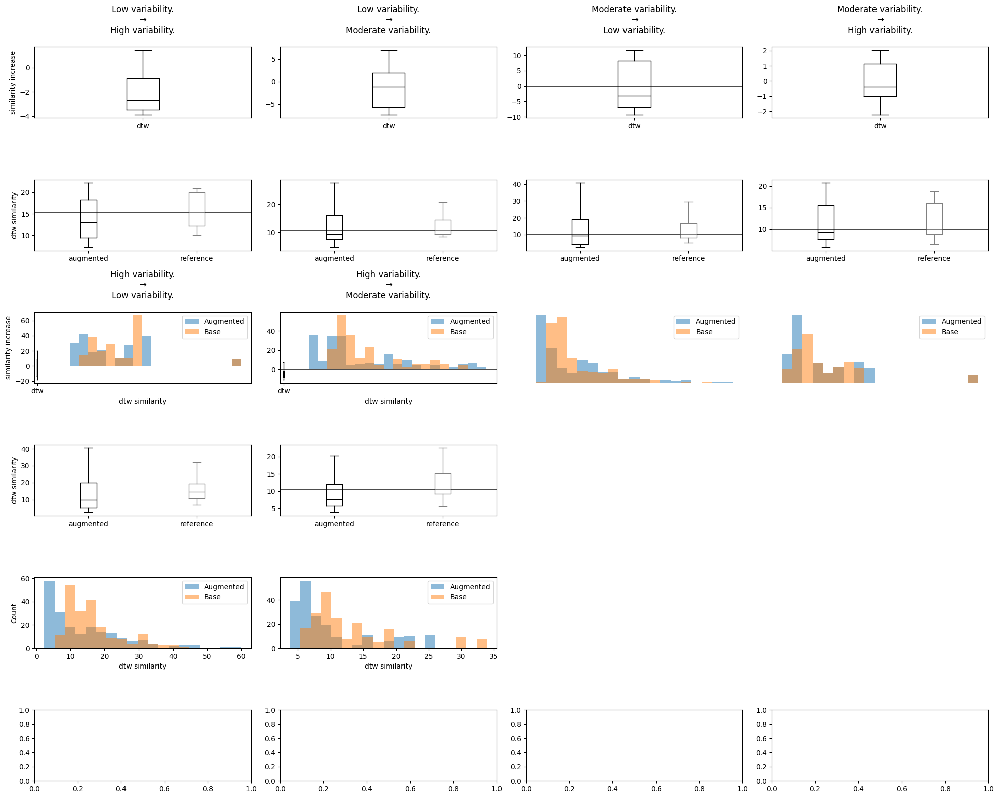

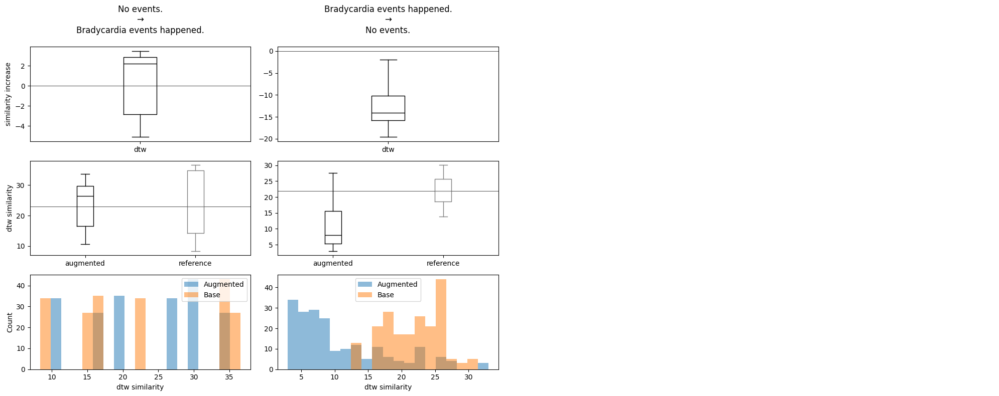

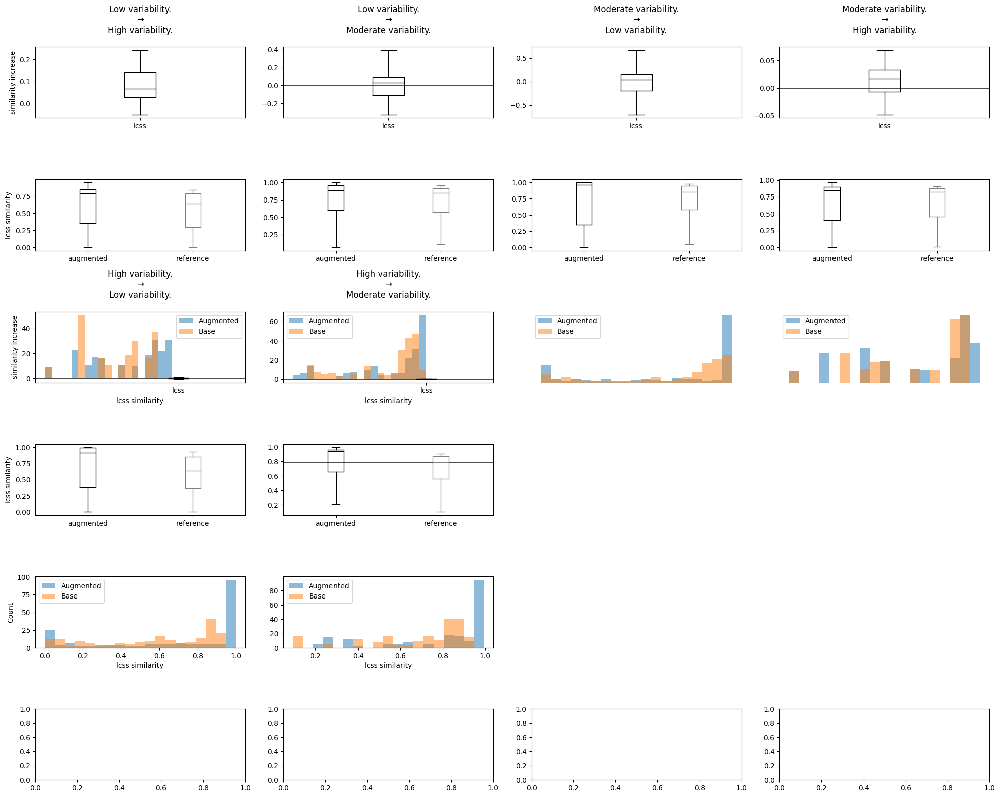

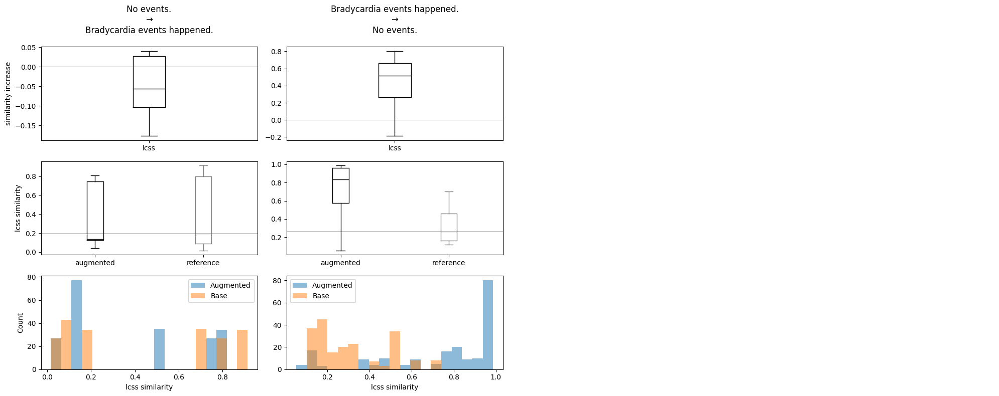

--------------------------------------------------------------------------------


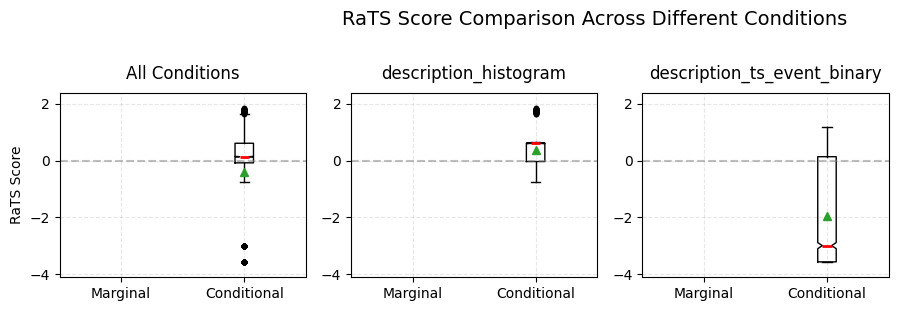

In [ ]:
w = 0.8
with open('run/eval.py', 'r') as file:
    exec(file.read())
with open('run/eng_eval.py', 'r') as file:
    exec(file.read())


In [24]:
res_df

nicu                                                     \
         method DTW distance decrease ↓ LCSS similarity increase ↑   
0  InstructTime     -2.03 [-6.82, 2.03]         0.04 [-0.05, 0.24]   
1         Tedit     -2.03 [-6.82, 2.03]         0.04 [-0.05, 0.24]   
2   Time weaver     -2.03 [-6.82, 2.03]         0.04 [-0.05, 0.24]   

                                           
               RaTS ↑ |RaTS (preserved)|↓  
0  0.14 [-0.08, 0.61]   1.19 [1.15, 1.19]  
1  0.14 [-0.08, 0.61]   1.19 [1.15, 1.19]  
2  0.14 [-0.08, 0.61]   1.19 [1.15, 1.19]

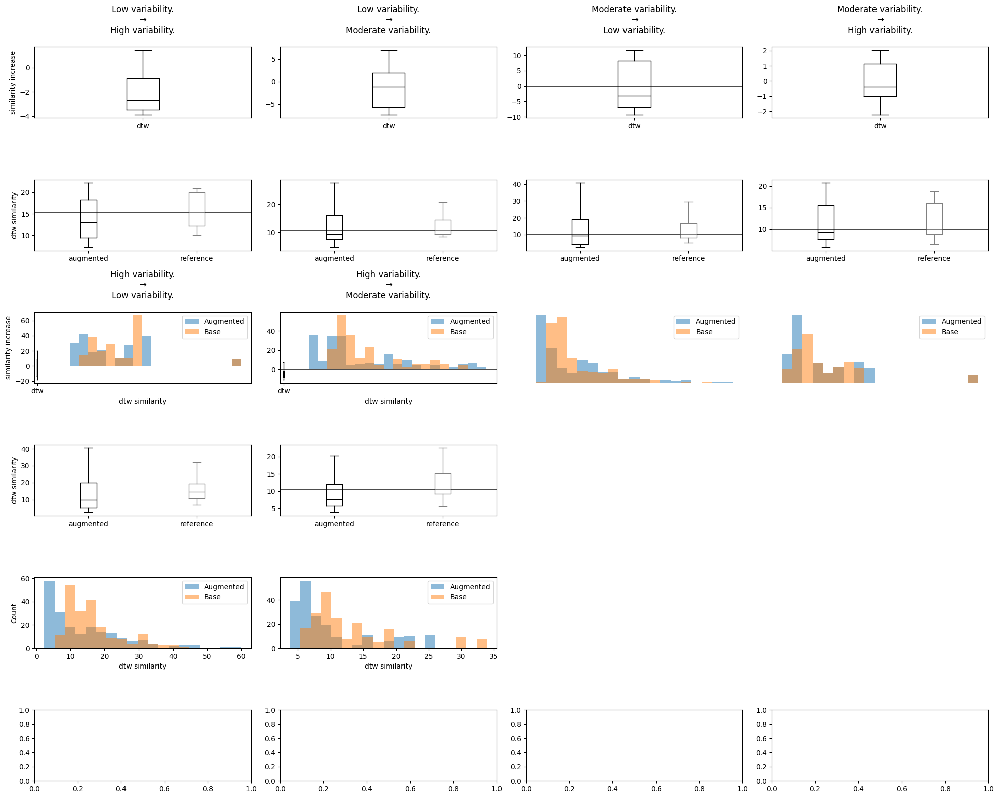

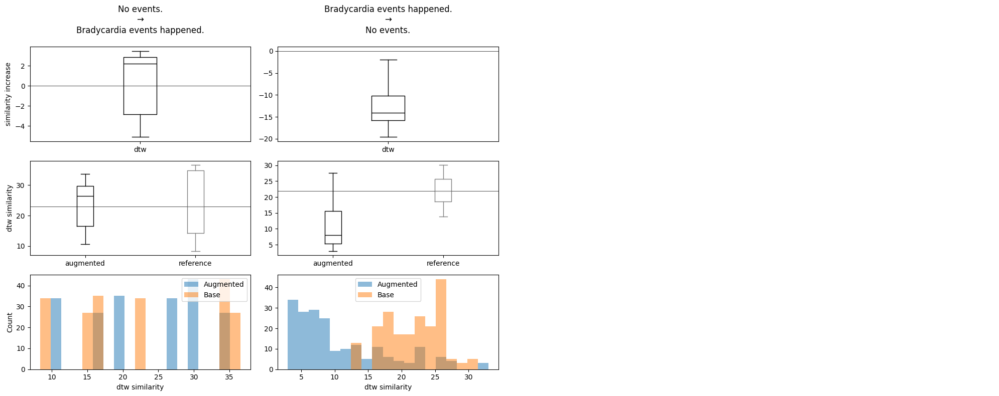

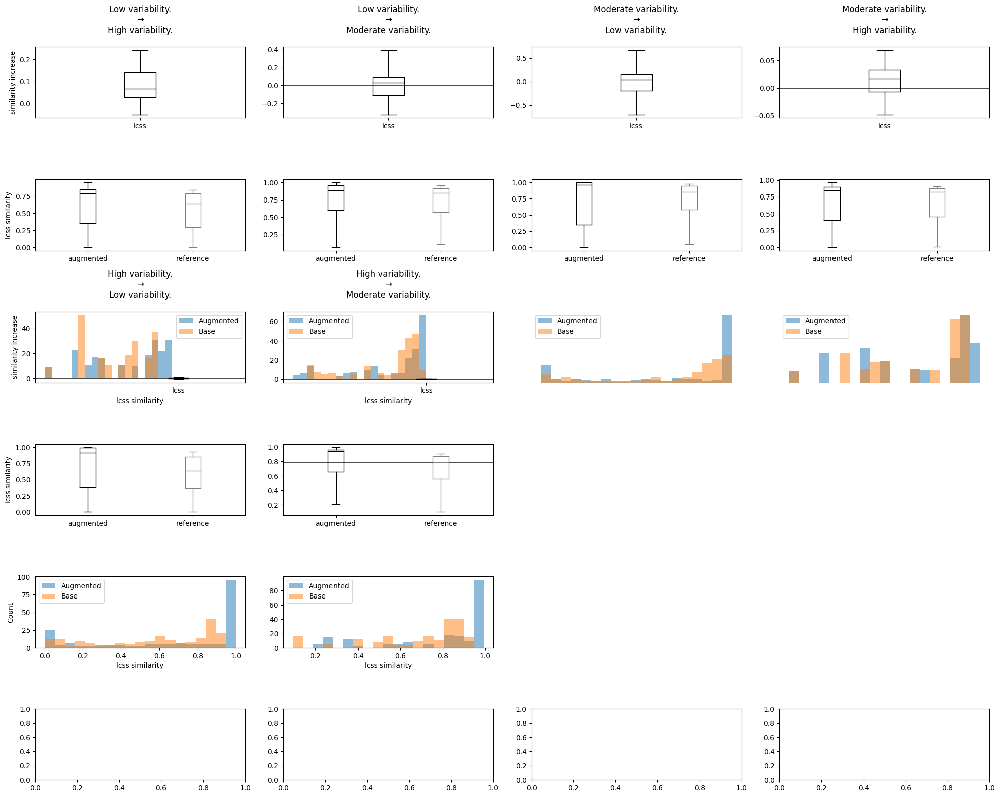

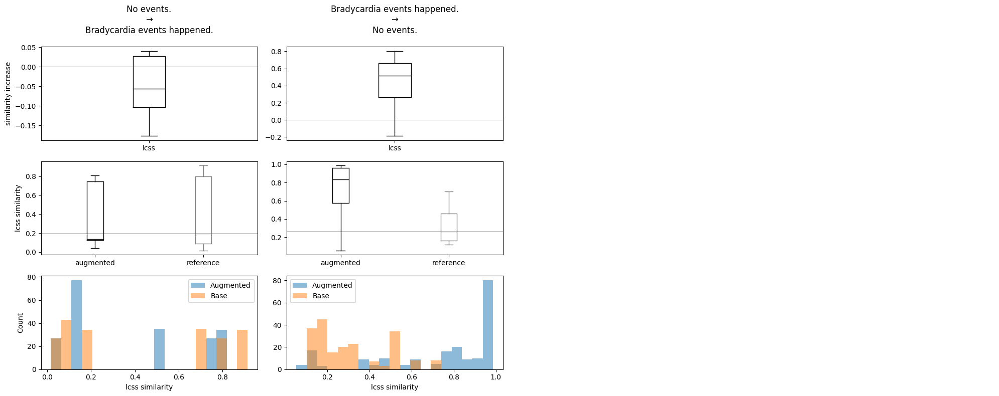

--------------------------------------------------------------------------------


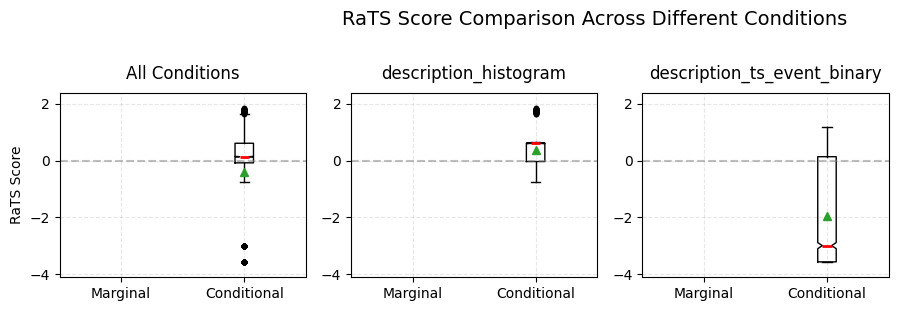

In [10]:
w = 0.8
with open('run/eval.py', 'r') as file:
    exec(file.read())
with open('run/eng_eval.py', 'r') as file:
    exec(file.read())


In [8]:
summarize_scores(df_all)

metric,DTW distance decrease ↓,LCSS similarity increase ↑,RaTS ↑,|RaTS (preserved)|↓
final_score,-4.28 (7.62),0.09 (0.23),-0.29 (2.62),2.00 (0.81)


In [9]:
summarize_scores(df_all, mean_sd = False)

metric,DTW distance decrease ↓,LCSS similarity increase ↑,RaTS ↑,|RaTS (preserved)|↓
final_score,"-2.97 [-5.22, -1.13]","0.04 [0.01, 0.13]","-0.02 [-2.30, 2.33]","2.10 [1.20, 2.60]"


description_succ_inc


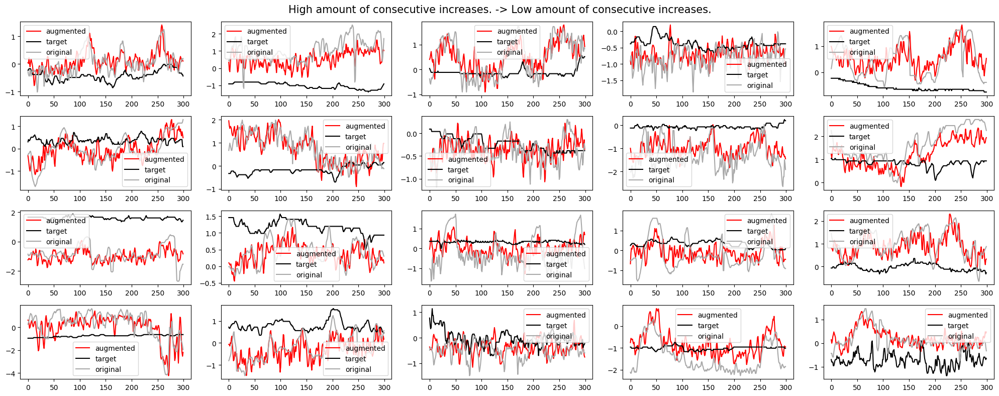

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2206.25it/s]


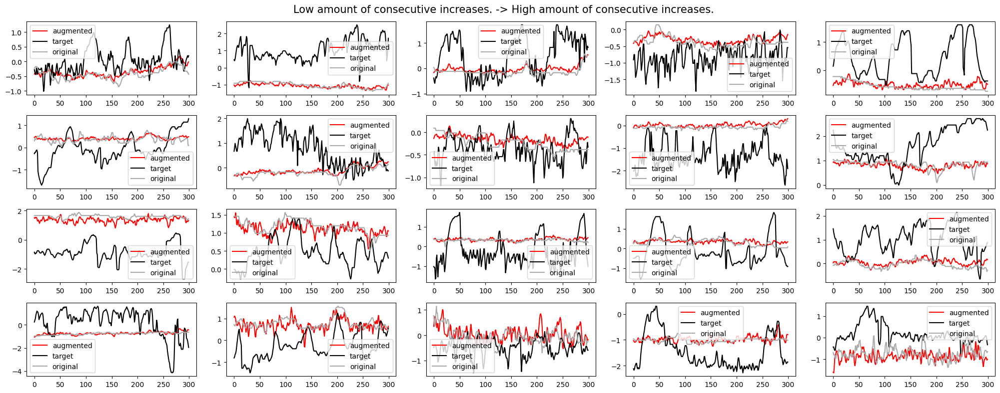

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2235.89it/s]


description_histogram


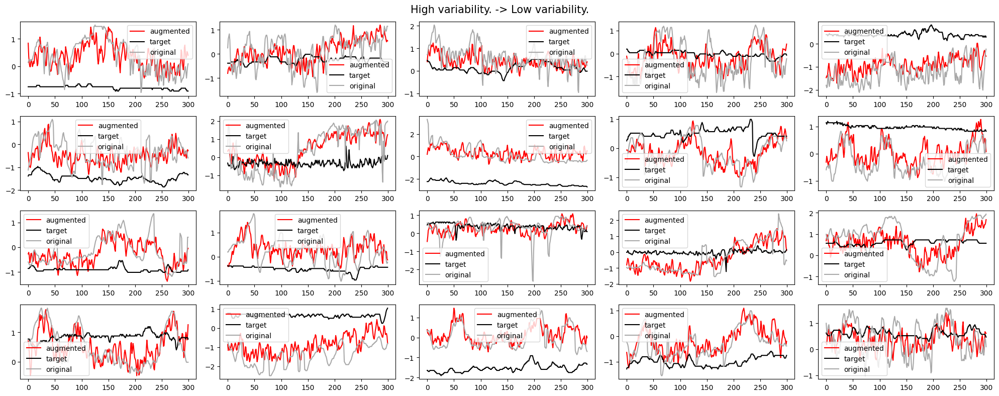

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2303.69it/s]


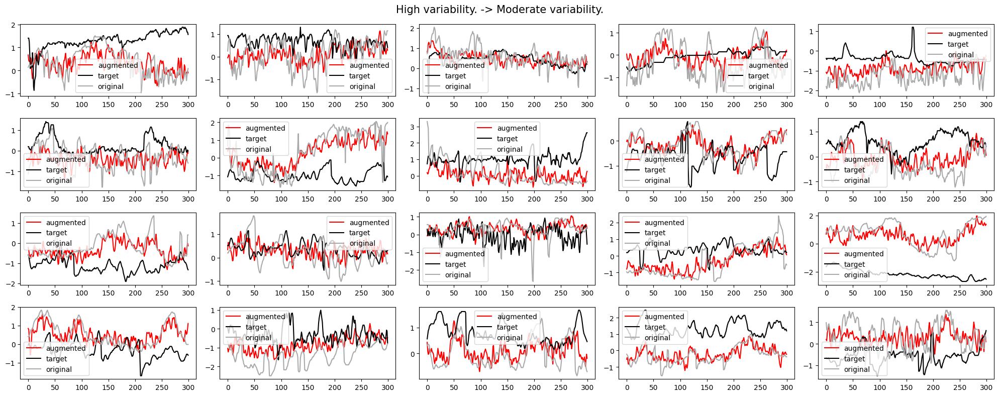

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2196.35it/s]


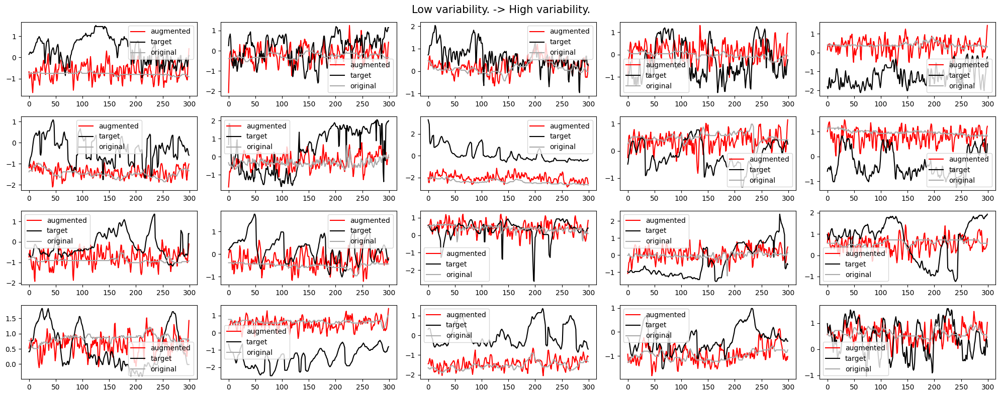

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2180.84it/s]


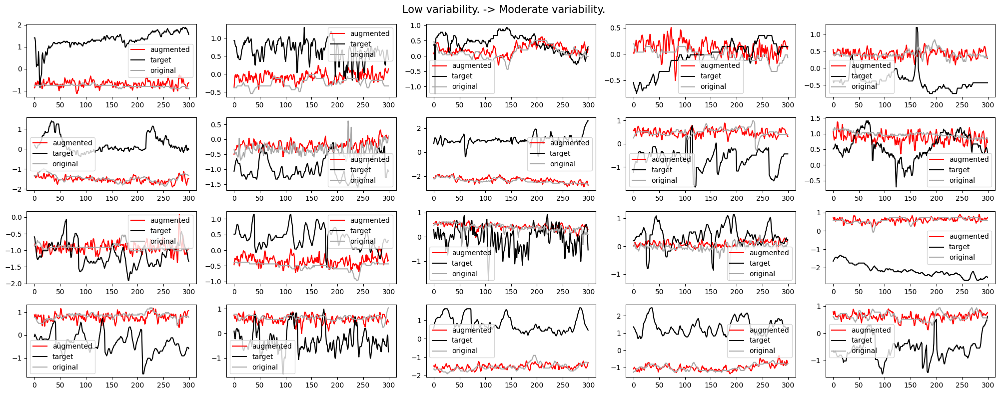

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2206.55it/s]


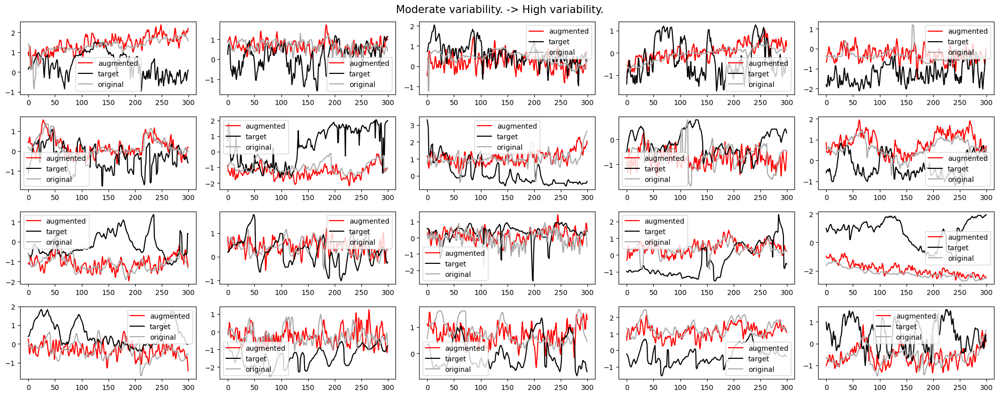

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2312.03it/s]


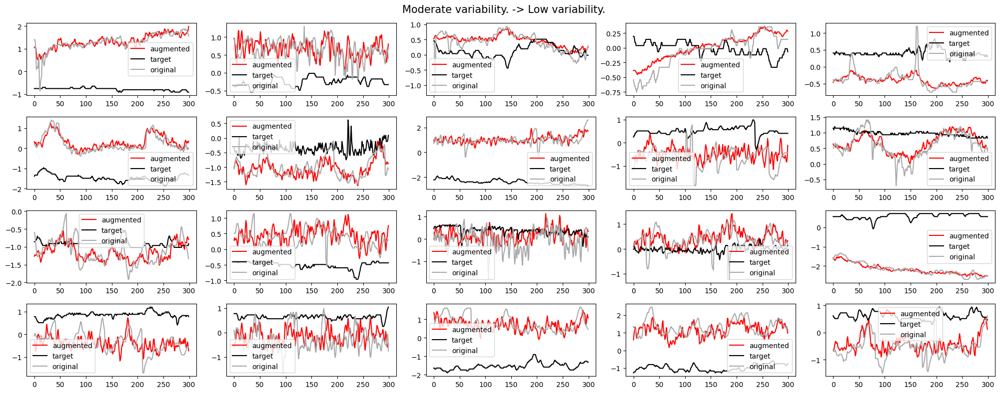

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2133.63it/s]


description_ts_event_binary


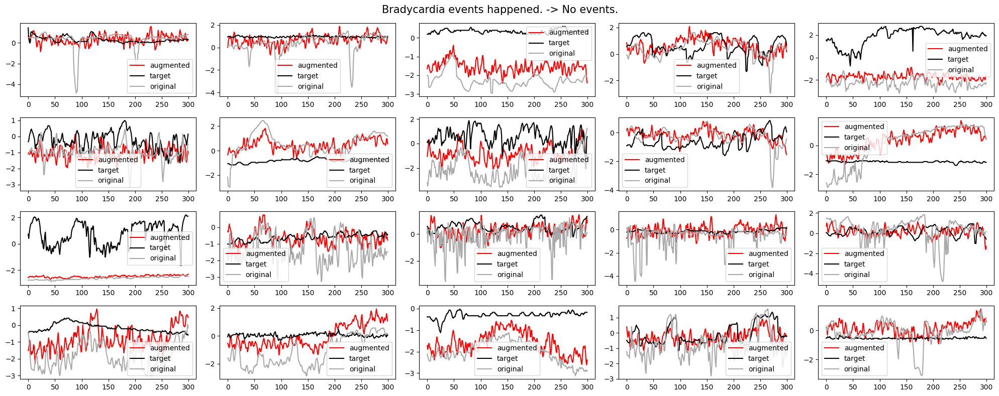

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2198.43it/s]


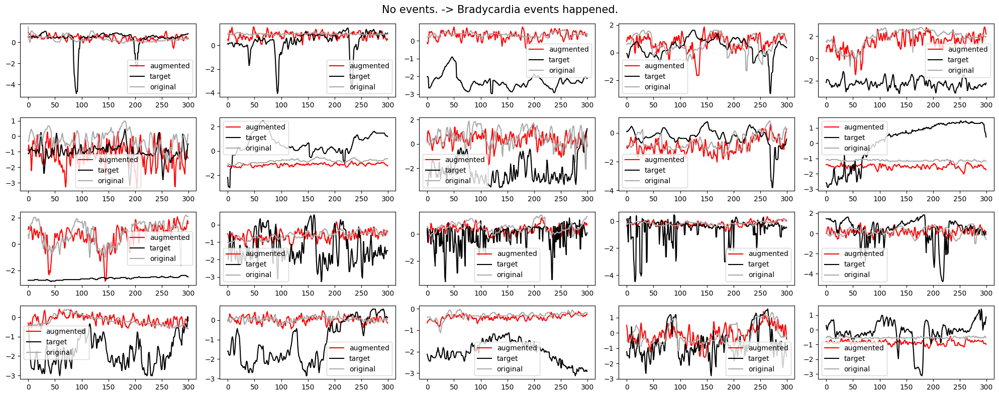

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2265.70it/s]


description_succ_inc


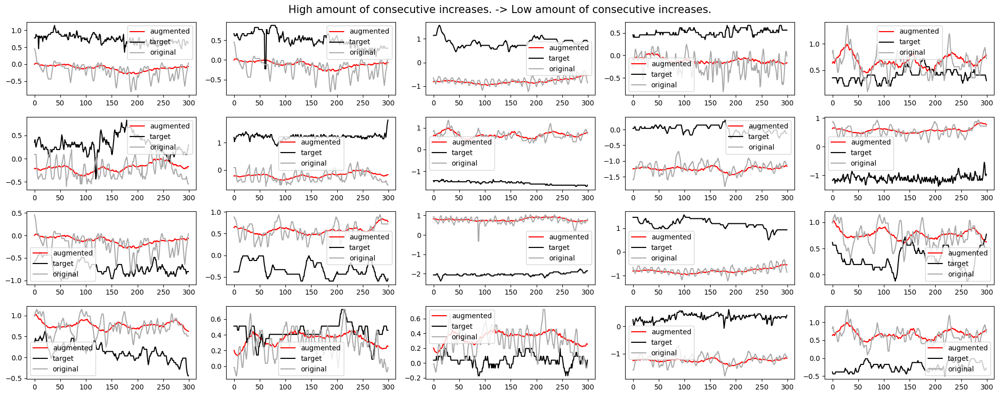

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2303.81it/s]


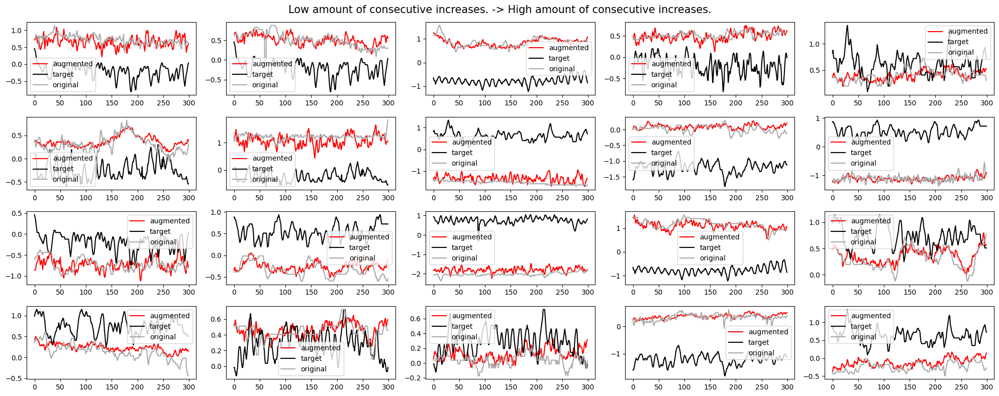

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2126.70it/s]


description_histogram


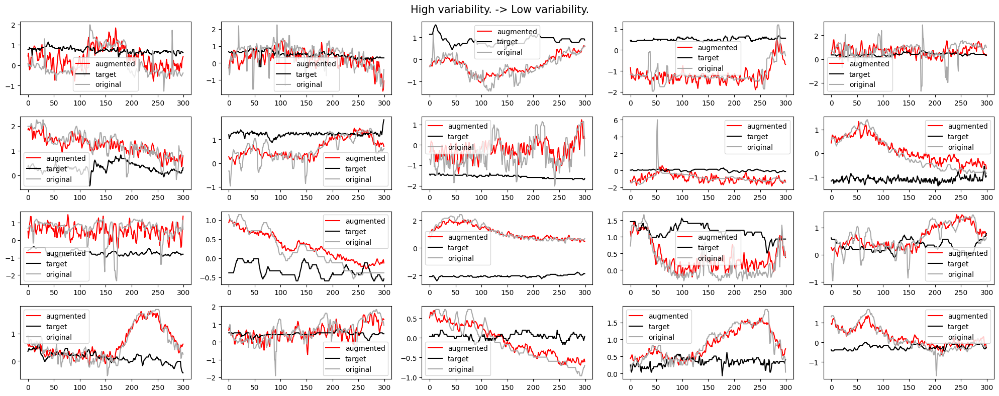

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2183.28it/s]


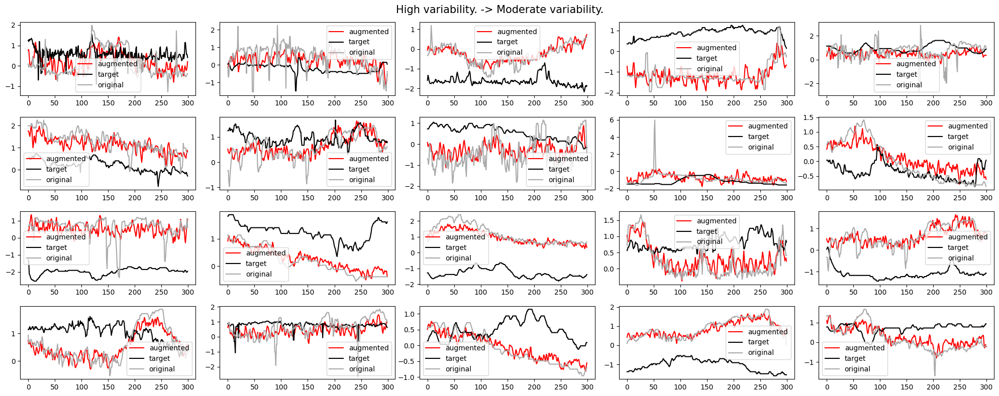

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2194.64it/s]


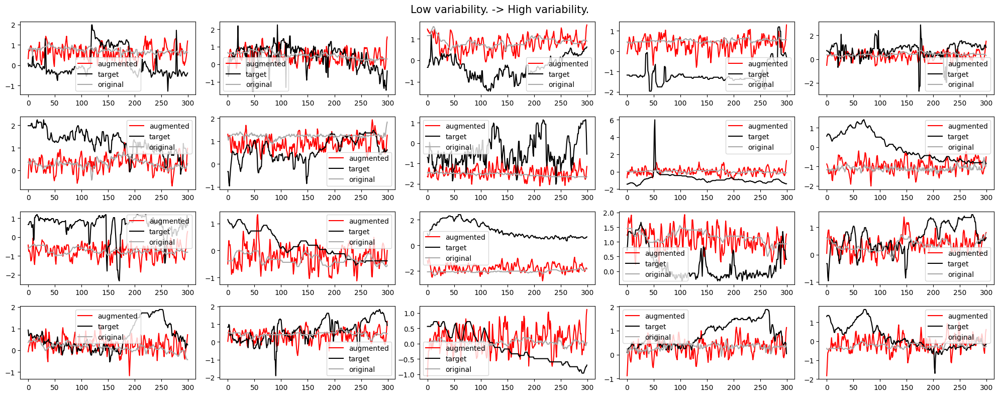

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2242.06it/s]


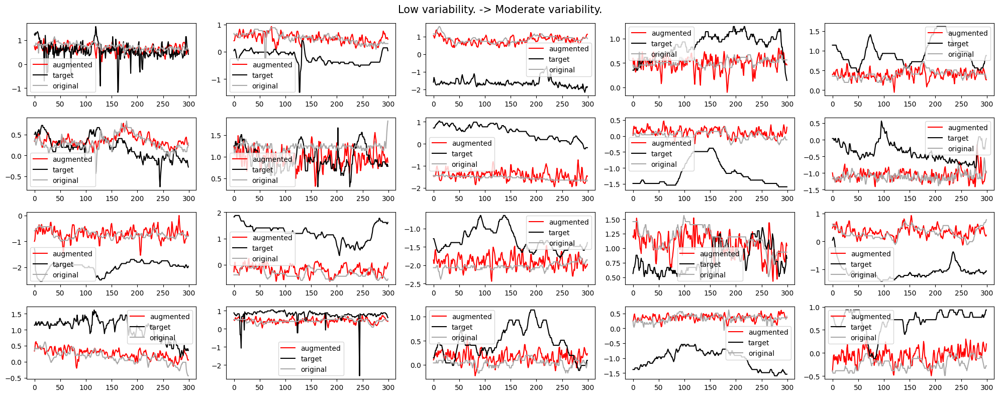

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2274.31it/s]


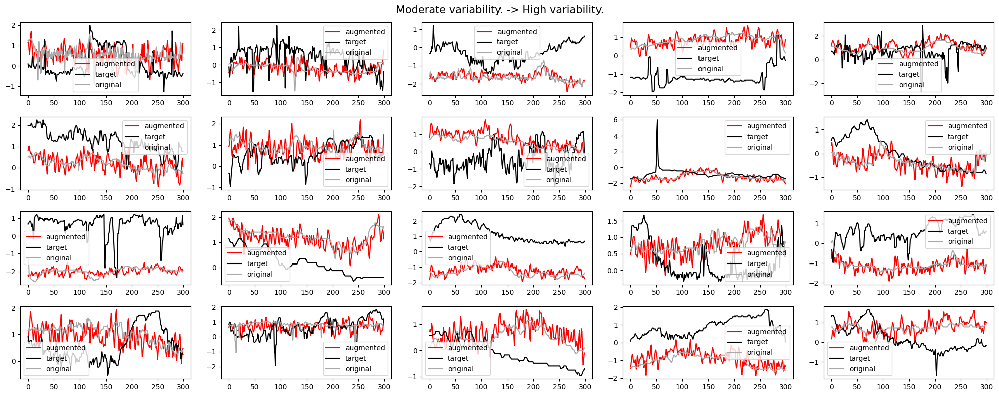

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2300.59it/s]


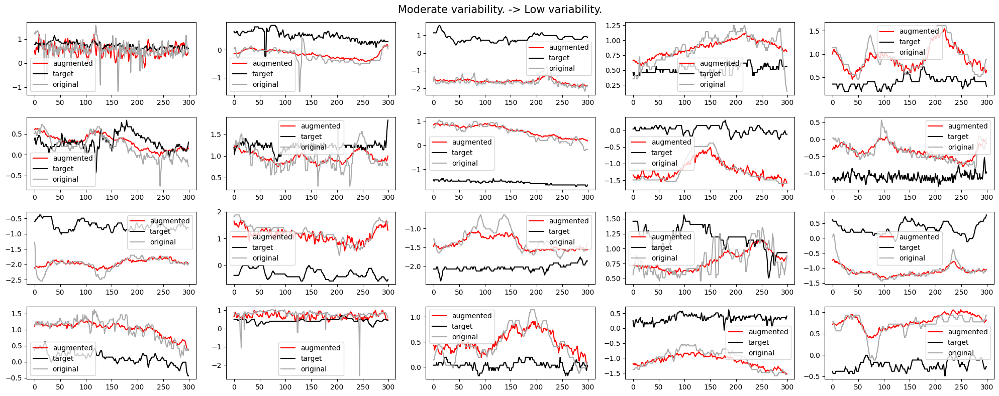

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2250.77it/s]


description_ts_event_binary


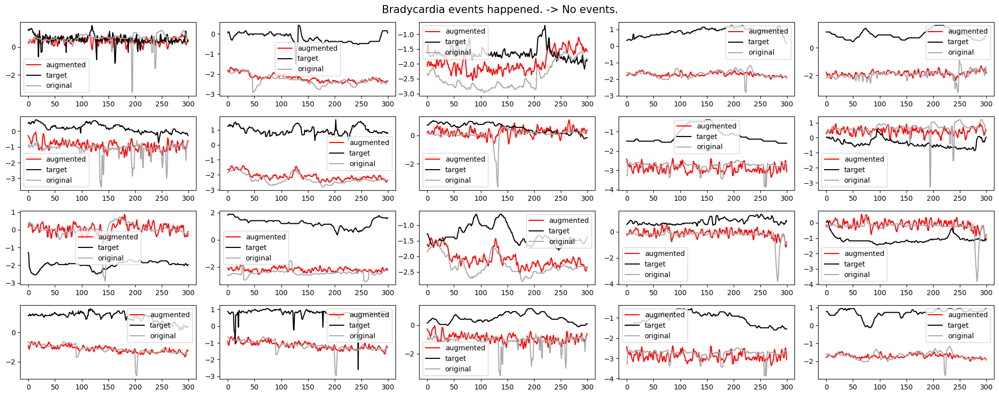

Similarity: 100%|██████████| 40000/40000 [00:18<00:00, 2211.58it/s]


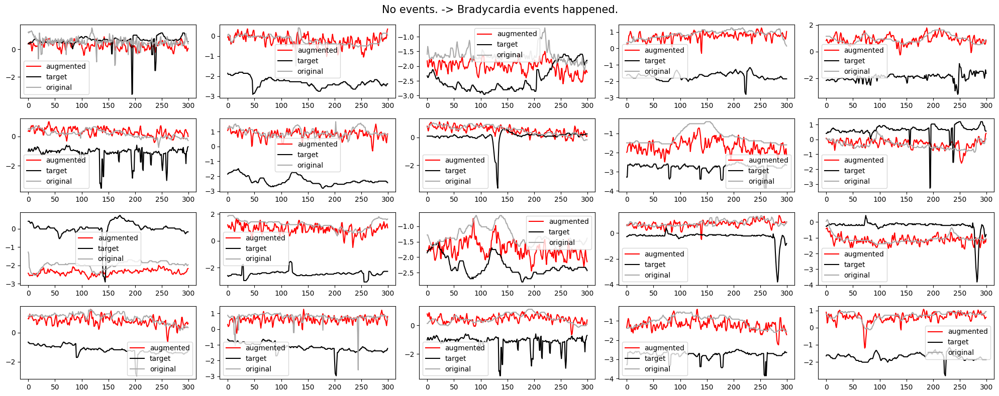

Similarity: 100%|██████████| 40000/40000 [00:17<00:00, 2296.88it/s]


Early stopping at epoch 357


Early stopping at epoch 495


Early stopping at epoch 323


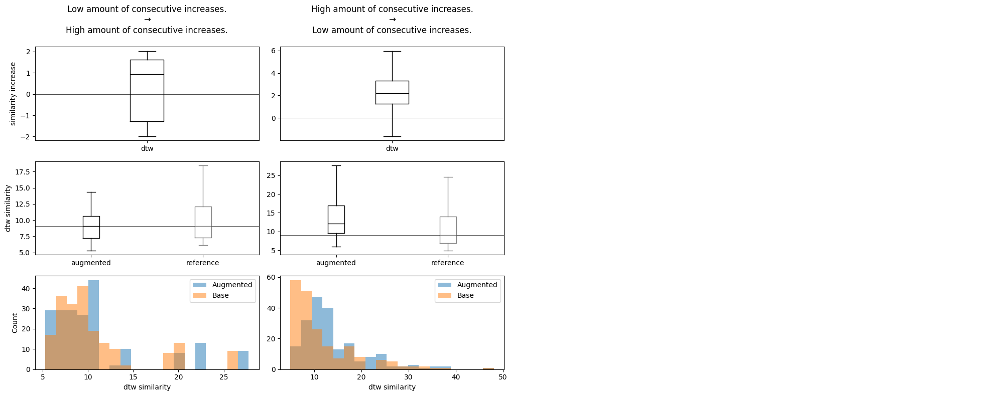

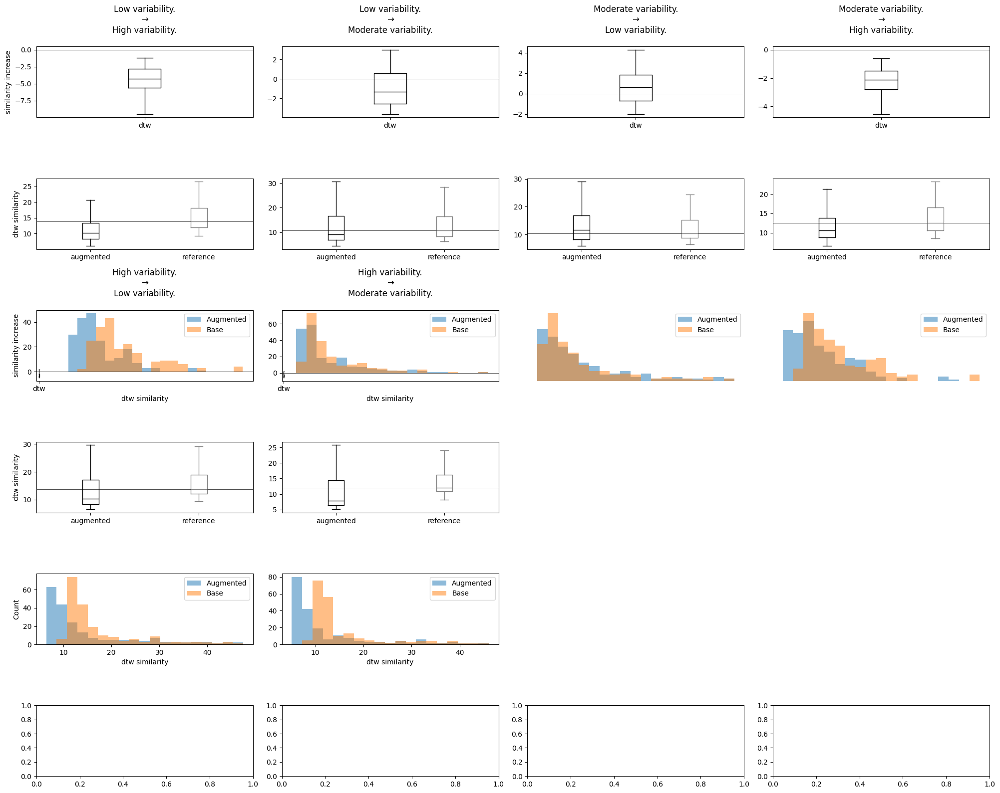

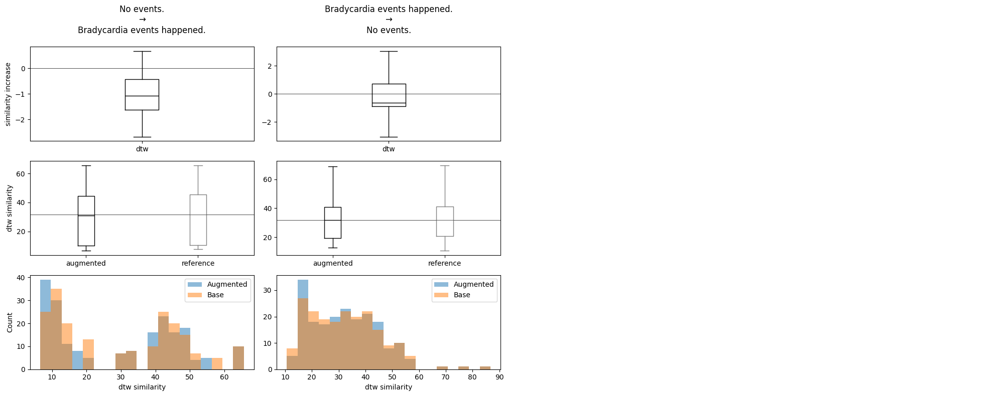

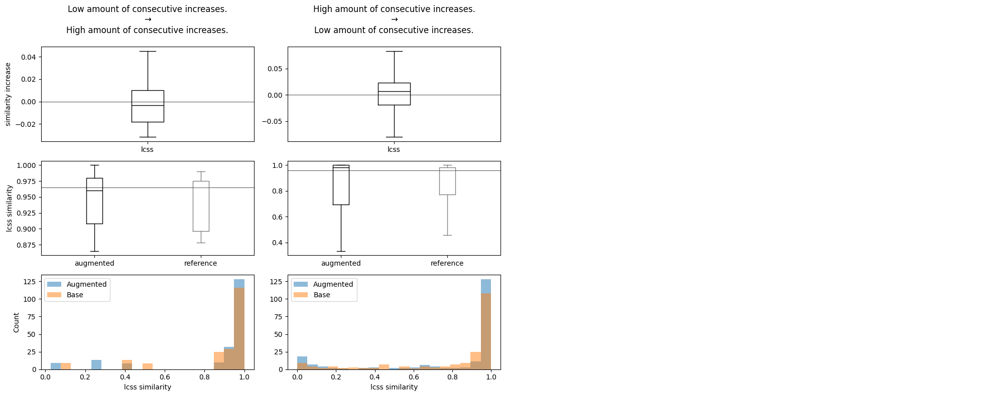

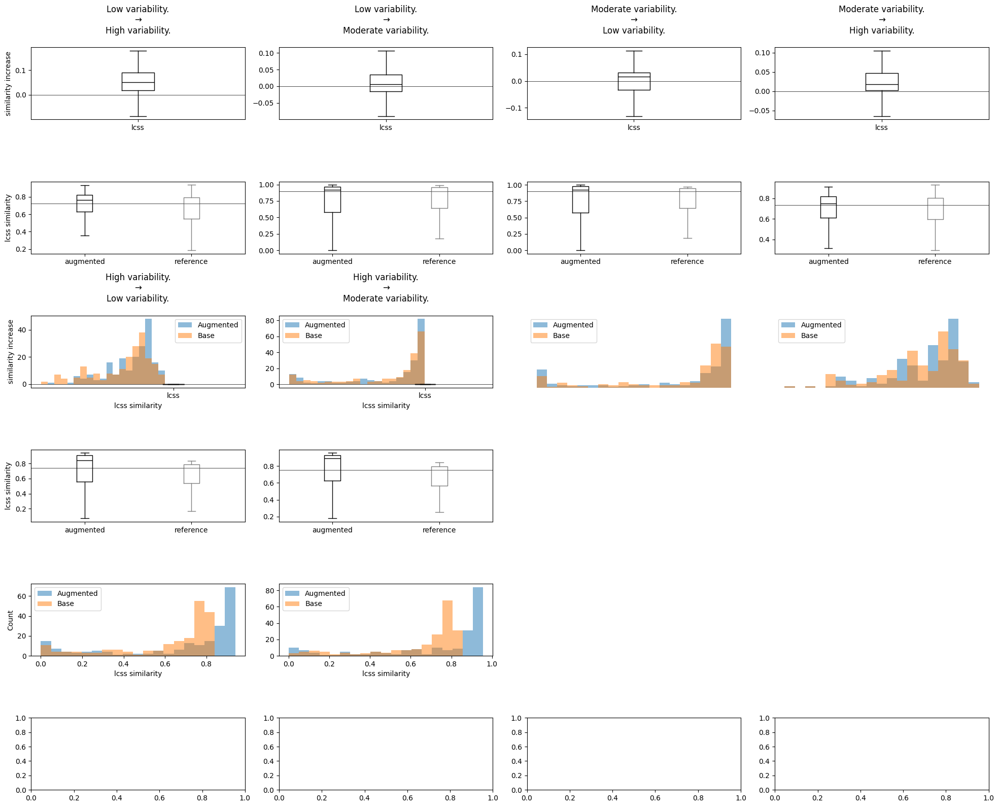

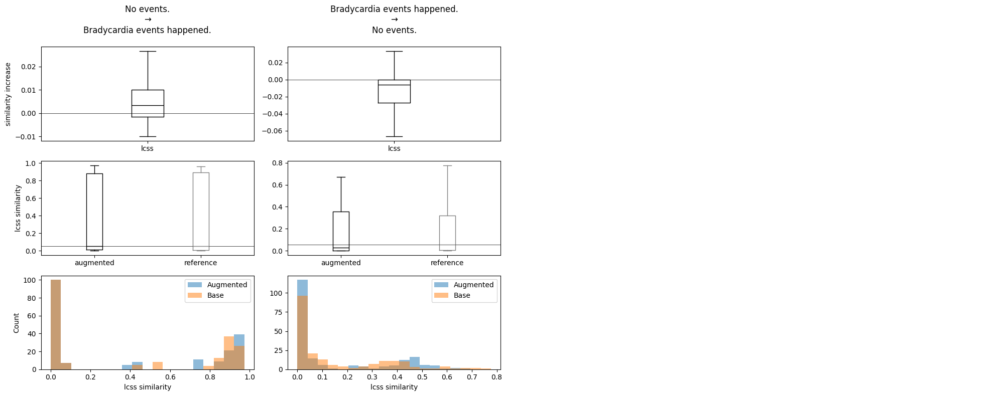

--------------------------------------------------------------------------------


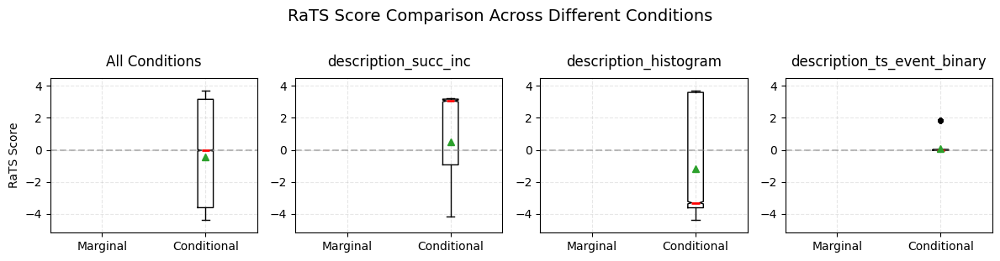

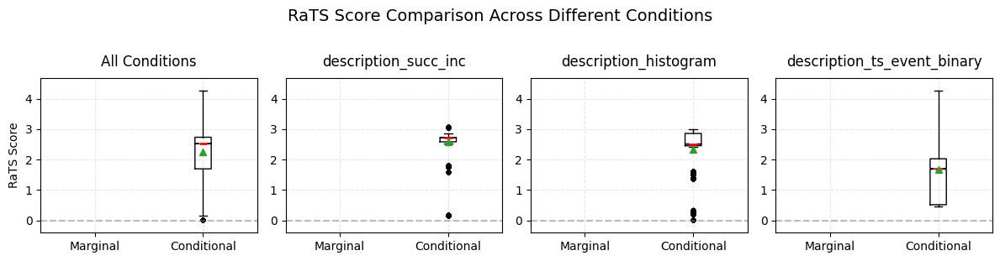

In [4]:
w = 0.6
with open('run/eval.py', 'r') as file:
    exec(file.read())
with open('run/eng_eval.py', 'r') as file:
    exec(file.read())


In [5]:
summarize_scores(df_all)

metric,DTW distance decrease ↓,LCSS similarity increase ↑,RaTS ↑,|RaTS (preserved)|↓
final_score,-1.14 (2.49),0.02 (0.07),-0.43 (2.92),2.24 (0.81)


In [6]:
summarize_scores(df_all, mean_sd = False)

metric,DTW distance decrease ↓,LCSS similarity increase ↑,RaTS ↑,|RaTS (preserved)|↓
final_score,"-1.21 [-2.76, 0.68]","0.01 [-0.01, 0.06]","-0.03 [-3.60, 3.16]","2.52 [1.69, 2.73]"
